# Temporary reviewed Humvee-label gallery

Displays every image in the synthetic unlabeled review set with its reviewed dominant-component box and canonical damage label.

In [1]:
from pathlib import Path
import math
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from PIL import Image

ROOT = Path.cwd()
if ROOT.name == 'experiments':
    ROOT = ROOT.parent
IMAGE_DIR = ROOT / 'datasets' / 'military' / 'humvee_unlabeled_v1' / 'images'
LABEL_PATH = ROOT / 'datasets' / 'military' / 'damage' / 'source' / 'synthetic_unlabeled_review_v1' / 'label_review.csv'
labels = pd.read_csv(LABEL_PATH)
labels = labels.sort_values('file_name').reset_index(drop=True)
assert len(labels) == 36, f'Expected 36 reviewed images, found {len(labels)}'
missing = [name for name in labels.file_name if not (IMAGE_DIR / name).is_file()]
assert not missing, f'Missing image files: {missing}'
display(labels[['file_name', 'component_class', 'component_group', 'damage_level', 'qa_status']])

,file_name,component_class,component_group,damage_level,qa_status
0,01_comms_possible.png,comms_equipment,mission_equipment,possible_damage,reviewed_dominant_component
1,02_weapon_station_severe.png,weapon_station,mission_equipment,severe_visible_damage,reviewed_dominant_component
2,03_windshield_severe.png,windshield,structure,severe_visible_damage,reviewed_dominant_component
3,04_door_possible.png,door,structure,possible_damage,reviewed_dominant_component
4,05_engine_bay_unobservable.png,engine_bay,structure,unobservable,reviewed_dominant_component
5,06_wheel_tire_severe.png,wheel_tire,mobility,severe_visible_damage,reviewed_dominant_component
6,07_comms_intact.png,comms_equipment,mission_equipment,no_visible_damage,reviewed_dominant_component
7,08_comms_severe.png,comms_equipment,mission_equipment,severe_visible_damage,reviewed_dominant_component
8,09_weapon_possible.png,weapon_station,mission_equipment,possible_damage,reviewed_dominant_component
9,10_weapon_intact.png,weapon_station,mission_equipment,no_visible_damage,reviewed_dominant_component


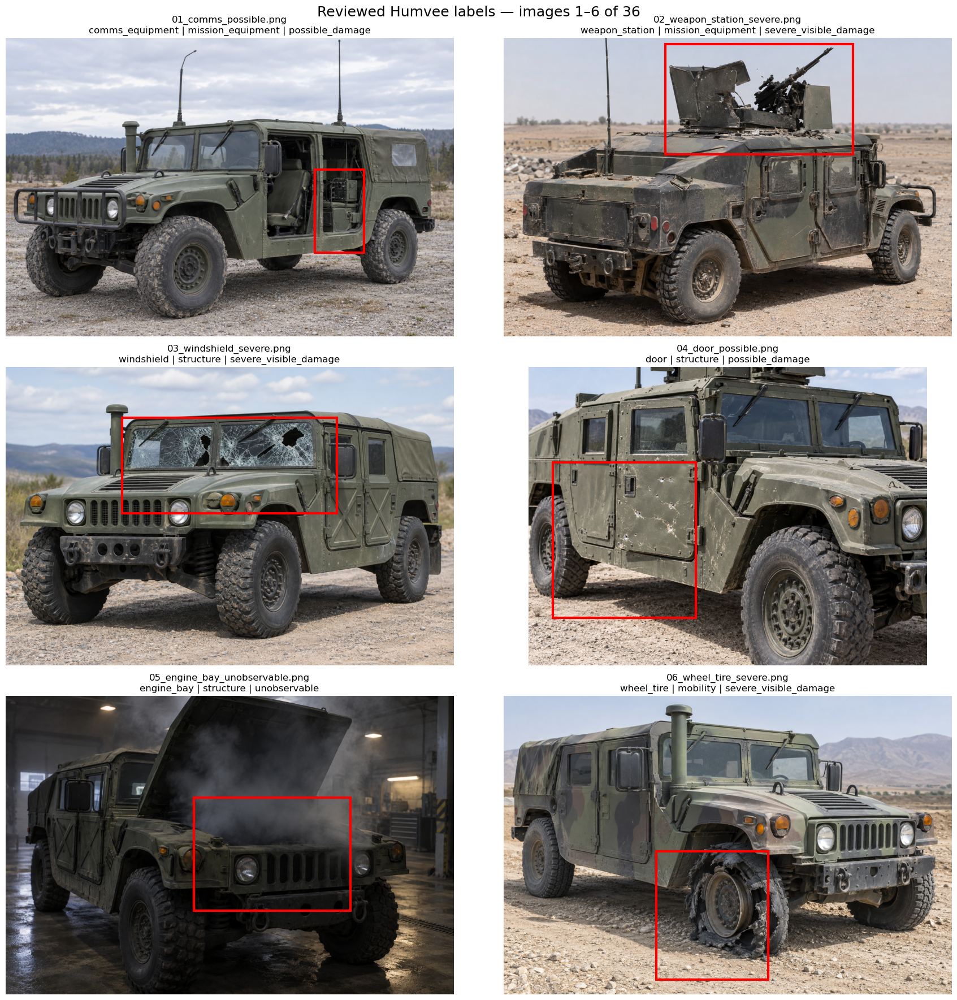

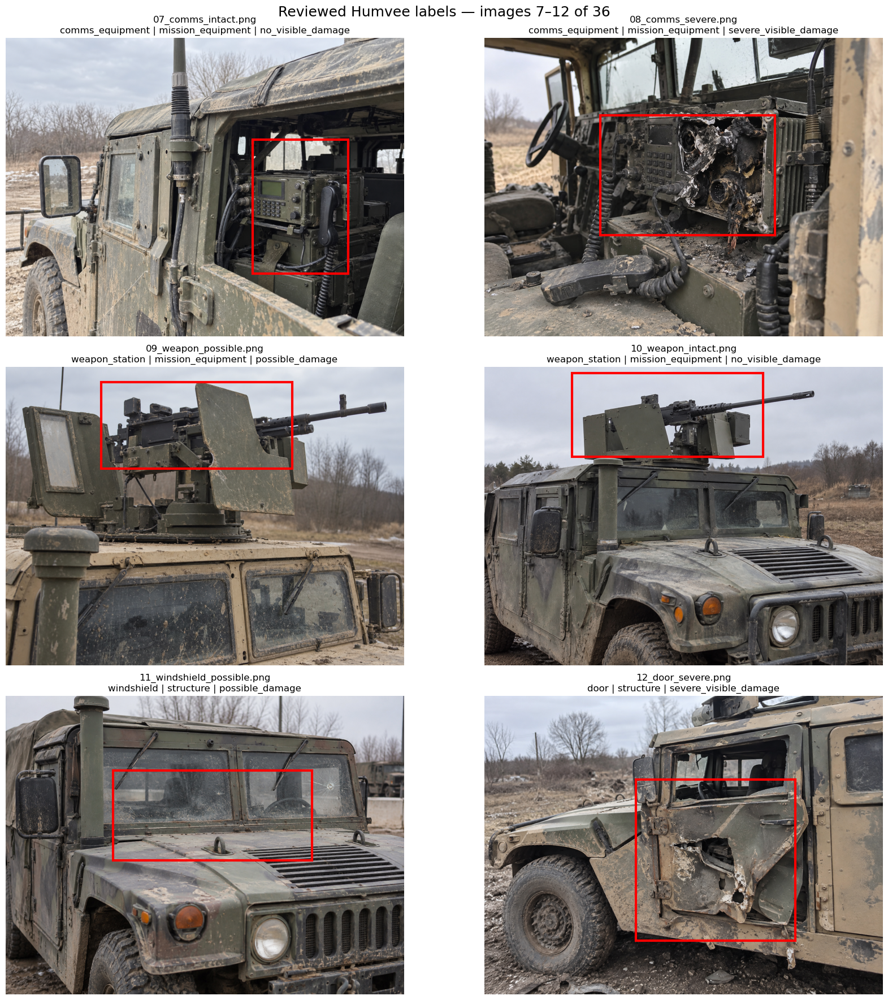

In [ ]:
# Display all reviewed images, six per page, with boxes and labels.
per_page = 6
for page_start in range(0, len(labels), per_page):
    page = labels.iloc[page_start:page_start + per_page]
    rows = math.ceil(len(page) / 2)
    fig, axes = plt.subplots(rows, 2, figsize=(18, 6 * rows))
    axes = list(axes.flat) if hasattr(axes, 'flat') else [axes]
    for ax, (_, record) in zip(axes, page.iterrows()):
        path = IMAGE_DIR / record['file_name']
        image = Image.open(path).convert('RGB')
        ax.imshow(image)
        x1, y1 = float(record['box_x1']), float(record['box_y1'])
        x2, y2 = float(record['box_x2']), float(record['box_y2'])
        ax.add_patch(Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, edgecolor='red', linewidth=3))
        ax.set_title(f"{record['file_name']}\n{record['component_class']} | {record['component_group']} | {record['damage_level']}", fontsize=12)
        ax.axis('off')
    for ax in axes[len(page):]:
        ax.axis('off')
    fig.suptitle(f'Reviewed Humvee labels — images {page_start + 1}–{page_start + len(page)} of {len(labels)}', fontsize=18)
    fig.tight_layout()
    plt.show()